In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import datetime
import matplotlib.dates as mdates

In [111]:
bpdata = pd.read_csv("bpdata.csv")
bpdata_noa = pd.read_csv("bpdata_noa.csv")
calds = pd.read_csv("calds.csv",names=["Year","Quarter"])
var_labels = pd.read_csv("bplabvec_long.csv",names=["Label"])

In [112]:
bpdata.head()

,NaN,NaN.1,NaN.2,NaN.3,NaN.4,NaN.5,NaN.6,NaN.7,NaN.8,NaN.9,...,NaN.183,NaN.184,NaN.185,NaN.186,NaN.187,NaN.188,NaN.189,NaN.190,NaN.191,NaN.192
0,0.014227,0.005304,0.022827,0.003952,0.001112,0.062618,0.018332,0.012693,0.013744,0.028256,...,-0.041741,-0.013931,-0.002364,0.016019,-0.004836,NaN,NaN,NaN,NaN,0.011099
1,-0.011699,0.000418,0.005026,0.002466,-0.003265,-0.079012,-0.001480,0.015249,0.011848,-0.024915,...,-0.001249,0.001657,0.005996,-0.010793,-0.013843,NaN,NaN,NaN,NaN,0.000849
2,-0.005820,-0.008827,-0.062926,0.001149,-0.000902,0.019813,-0.023673,-0.018783,-0.017363,-0.034727,...,0.014089,0.001296,0.007746,0.027083,-0.018261,NaN,NaN,NaN,NaN,0.020755
3,0.012316,-0.000460,0.017535,-0.001931,-0.004577,0.083615,0.020861,0.017329,0.019564,0.024249,...,0.026844,0.008344,-0.008004,-0.027850,-0.006025,NaN,NaN,NaN,NaN,-0.019628
4,-0.013491,0.002686,0.008473,0.000182,0.003807,-0.109970,-0.030280,-0.000029,-0.000008,-0.091390,...,-0.025007,0.001372,0.007347,-0.034448,-0.006827,NaN,NaN,NaN,NaN,-0.003847


In [113]:
var_labels

,Label
0,Real Gross Domestic Product 3 Decimal
1,Real Personal Consumption Expenditures
2,Real Personal Consumption Expenditures: Durabl...
3,Real Personal Consumption Expenditures: Servic...
4,Real Personal Consumption Expenditures: Nondur...
...,...
202,Crude Oil: West Texas Intermediate (WTI) - Cus...
203,Crude Oil Prices: Brent - Europe Defl by PCE(L...
204,Conventional Gasoline Prices: New York Harbor ...
205,U.S. Crude Oil Imported Acquisition Cost by Re...


In [114]:
def formatting(string):
    if len(string)>37: 
        string = string[:37]+"-\n"+string[37:]
    if len(string)>80: 
        string = string[:80]+"-\n"+string[80:]
    return string
    

In [115]:
formatting(var_labels.loc[200].at["Label"])

'U.S. Ending Stocks excluding SPR of C-\nrude Oil and Petroleum Products (Thousand-\n Barrels); SA using X11 in RATS'

In [116]:
var_labels = var_labels.applymap(formatting)

In [122]:
print(var_labels.loc[200].at["Label"])

U.S. Ending Stocks excluding SPR of C-
rude Oil and Petroleum Products (Thousand-
 Barrels); SA using X11 in RATS


In [107]:
var_labels.loc[3].at["Label"]

'Real Personal Consumption Expenditure-\ns: Services Quantity Index'

In [117]:
var_labels

,Label
0,Real Gross Domestic Product 3 Decimal
1,Real Personal Consumption Expenditure-\ns
2,Real Personal Consumption Expenditure-\ns: Dur...
3,Real Personal Consumption Expenditure-\ns: Ser...
4,Real Personal Consumption Expenditure-\ns: Non...
...,...
202,Crude Oil: West Texas Intermediate (W-\nTI) - ...
203,Crude Oil Prices: Brent - Europe Defl-\n by PC...
204,Conventional Gasoline Prices: New Yor-\nk Harb...
205,U.S. Crude Oil Imported Acquisition C-\nost by...


In [120]:
bpdata.columns = var_labels.Label

In [123]:
bpdata

Label,Real Gross Domestic Product 3 Decimal,Real Personal Consumption Expenditure-\ns,Real Personal Consumption Expenditure-\ns: Durable Goods Quantity Index,Real Personal Consumption Expenditure-\ns: Services Quantity Index,Real Personal Consumption Expenditure-\ns: Nondurable Goods Quantity Index,Real Gross Private Domestic Investmen-\nt 3 Decimal,Real Private Fixed Investment Quantit-\ny Index,Real Nonresidential Investment: Equip-\nment Quantity Idenx,Real Private Nonresidential Fixed Inv-\nestment Quantity Index,Real Private Residential Fixed Invest-\nment Quantity Index,...,World Oil Production.1994:Q1 on from -\nEIA (Crude Oil including Lease Condensate-\n); Data prior to 1994 from From Baumeister and Peerlman (2013),World Oil Production.1994:Q1 on from -\nEIA (Crude Oil including Lease Condensate-\n); Data prior to 1994 from From Baumeister and Peerlman (2013); Seasonally adjusted using RATS X11 (note seasonality before 1970),IP: Consumer Energy Products,U.S. Ending Stocks excluding SPR of C-\nrude Oil and Petroleum Products (Thousand-\n Barrels); SA using X11 in RATS,PPI: Crude Petroleum Defl by PCE(LFE)-\n Def,Crude Oil: West Texas Intermediate (W-\nTI) - Cushing Oklahoma Defl by PCE(LFE) D-\nef,Crude Oil Prices: Brent - Europe Defl-\n by PCE(LFE) Def,Conventional Gasoline Prices: New Yor-\nk Harbor Regular Defl by PCE(LFE) Def,U.S. Crude Oil Imported Acquisition C-\nost by Refiners (Dollars per Barrel) Defl-\n by PCE(LFE) Def,CPI Gasoline (NSA) BLS: CUUR0000SETB0-\n1 Defl by PCE(LFE) Def
0,0.014227,0.005304,0.022827,0.003952,0.001112,0.062618,0.018332,0.012693,0.013744,0.028256,...,-0.041741,-0.013931,-0.002364,0.016019,-0.004836,NaN,NaN,NaN,NaN,0.011099
1,-0.011699,0.000418,0.005026,0.002466,-0.003265,-0.079012,-0.001480,0.015249,0.011848,-0.024915,...,-0.001249,0.001657,0.005996,-0.010793,-0.013843,NaN,NaN,NaN,NaN,0.000849
2,-0.005820,-0.008827,-0.062926,0.001149,-0.000902,0.019813,-0.023673,-0.018783,-0.017363,-0.034727,...,0.014089,0.001296,0.007746,0.027083,-0.018261,NaN,NaN,NaN,NaN,0.020755
3,0.012316,-0.000460,0.017535,-0.001931,-0.004577,0.083615,0.020861,0.017329,0.019564,0.024249,...,0.026844,0.008344,-0.008004,-0.027850,-0.006025,NaN,NaN,NaN,NaN,-0.019628
4,-0.013491,0.002686,0.008473,0.000182,0.003807,-0.109970,-0.030280,-0.000029,-0.000008,-0.091390,...,-0.025007,0.001372,0.007347,-0.034448,-0.006827,NaN,NaN,NaN,NaN,-0.003847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,0.003277,0.003066,0.001273,0.003931,0.001800,0.003403,0.009723,0.022928,0.016579,-0.019825,...,0.000120,-0.004243,0.045255,-0.013916,-0.126190,-0.098630,-0.026318,-0.081920,-0.119950,-0.091017
219,-0.010622,-0.002980,-0.004885,-0.001943,-0.004736,-0.023656,-0.004931,-0.012446,-0.004157,-0.010994,...,0.006957,0.004811,0.043664,-0.026092,-0.000815,-0.000289,-0.025896,0.000793,-0.002017,0.021153
220,0.005960,0.000291,0.020327,-0.002969,0.000644,0.037860,0.017426,0.016683,0.015089,0.023620,...,-0.005401,0.001643,-0.060347,0.029557,0.031817,0.029094,-0.004129,0.034923,0.027771,0.064802
221,0.006877,0.001975,0.009429,0.001029,0.001532,0.011519,0.013364,0.016335,0.013267,0.010712,...,0.009162,0.008604,-0.035505,0.005772,-0.089898,-0.070286,-0.091173,-0.065552,-0.067107,-0.056404


In [124]:
bpdata_noa.columns = var_labels.Label

In [125]:
bpdata_noa

Label,Real Gross Domestic Product 3 Decimal,Real Personal Consumption Expenditure-\ns,Real Personal Consumption Expenditure-\ns: Durable Goods Quantity Index,Real Personal Consumption Expenditure-\ns: Services Quantity Index,Real Personal Consumption Expenditure-\ns: Nondurable Goods Quantity Index,Real Gross Private Domestic Investmen-\nt 3 Decimal,Real Private Fixed Investment Quantit-\ny Index,Real Nonresidential Investment: Equip-\nment Quantity Idenx,Real Private Nonresidential Fixed Inv-\nestment Quantity Index,Real Private Residential Fixed Invest-\nment Quantity Index,...,World Oil Production.1994:Q1 on from -\nEIA (Crude Oil including Lease Condensate-\n); Data prior to 1994 from From Baumeister and Peerlman (2013),World Oil Production.1994:Q1 on from -\nEIA (Crude Oil including Lease Condensate-\n); Data prior to 1994 from From Baumeister and Peerlman (2013); Seasonally adjusted using RATS X11 (note seasonality before 1970),IP: Consumer Energy Products,U.S. Ending Stocks excluding SPR of C-\nrude Oil and Petroleum Products (Thousand-\n Barrels); SA using X11 in RATS,PPI: Crude Petroleum Defl by PCE(LFE)-\n Def,Crude Oil: West Texas Intermediate (W-\nTI) - Cushing Oklahoma Defl by PCE(LFE) D-\nef,Crude Oil Prices: Brent - Europe Defl-\n by PCE(LFE) Def,Conventional Gasoline Prices: New Yor-\nk Harbor Regular Defl by PCE(LFE) Def,U.S. Crude Oil Imported Acquisition C-\nost by Refiners (Dollars per Barrel) Defl-\n by PCE(LFE) Def,CPI Gasoline (NSA) BLS: CUUR0000SETB0-\n1 Defl by PCE(LFE) Def
0,0.024026,0.015302,0.036974,0.014864,0.008230,0.074910,0.030387,0.029545,0.028441,0.034316,...,-0.025944,0.002233,0.011169,0.020647,-0.002607,NaN,NaN,NaN,NaN,0.012069
1,-0.001928,0.010396,0.019134,0.013359,0.003835,-0.066761,0.010545,0.032059,0.026506,-0.018881,...,0.014449,0.017714,0.019460,-0.006163,-0.011416,NaN,NaN,NaN,NaN,0.001931
2,0.003924,0.001130,-0.048857,0.012022,0.006181,0.032025,-0.011679,-0.002016,-0.002743,-0.028717,...,0.029685,0.017245,0.021139,0.031712,-0.015641,NaN,NaN,NaN,NaN,0.021945
3,0.022032,0.009478,0.031566,0.008923,0.002488,0.095790,0.032825,0.034055,0.034147,0.030237,...,0.042336,0.024182,0.005317,-0.023224,-0.003214,NaN,NaN,NaN,NaN,-0.018334
4,-0.003802,0.012605,0.022467,0.011015,0.010856,-0.097835,-0.018345,0.016655,0.014538,-0.085424,...,-0.009620,0.017098,0.020596,-0.029827,-0.003831,NaN,NaN,NaN,NaN,-0.002452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,0.008599,0.009115,0.013964,0.009184,0.006607,0.009313,0.015169,0.032955,0.024783,-0.022284,...,0.002746,-0.001570,0.048758,-0.011616,-0.114150,-0.086999,-0.012954,-0.070220,-0.106900,-0.083953
219,-0.005327,0.003038,0.007771,0.003281,0.000046,-0.017797,0.000455,-0.002482,0.003997,-0.013543,...,0.009579,0.007480,0.047153,-0.023749,0.011203,0.011299,-0.012571,0.012464,0.010998,0.028192
220,0.011228,0.006279,0.032945,0.002224,0.005400,0.043666,0.022751,0.026584,0.023194,0.020979,...,-0.002785,0.004308,-0.056874,0.031942,0.043804,0.040635,0.009153,0.046562,0.040747,0.071815
221,0.012117,0.007932,0.022007,0.006193,0.006262,0.017272,0.018626,0.026171,0.021321,0.007978,...,0.011773,0.011264,-0.032048,0.008200,-0.077947,-0.058799,-0.077942,-0.053953,-0.054175,-0.049421


In [126]:
calds["Month"]=1+(calds["Quarter"]-1)*3

In [127]:
calds

,Year,Quarter,Month
0,1959,1,1
1,1959,2,4
2,1959,3,7
3,1959,4,10
4,1960,1,1
...,...,...,...
219,2013,4,10
220,2014,1,1
221,2014,2,4
222,2014,3,7


In [128]:
calds["Date"] = calds.Year.apply(str)+"-"+calds.Month.apply(str)

In [129]:
calds

,Year,Quarter,Month,Date
0,1959,1,1,1959-1
1,1959,2,4,1959-4
2,1959,3,7,1959-7
3,1959,4,10,1959-10
4,1960,1,1,1960-1
...,...,...,...,...
219,2013,4,10,2013-10
220,2014,1,1,2014-1
221,2014,2,4,2014-4
222,2014,3,7,2014-7


In [130]:
calds.Date = pd.to_datetime(calds.Date,format="%Y-%m")

In [131]:
calds

,Year,Quarter,Month,Date
0,1959,1,1,1959-01-01
1,1959,2,4,1959-04-01
2,1959,3,7,1959-07-01
3,1959,4,10,1959-10-01
4,1960,1,1,1960-01-01
...,...,...,...,...
219,2013,4,10,2013-10-01
220,2014,1,1,2014-01-01
221,2014,2,4,2014-04-01
222,2014,3,7,2014-07-01


In [132]:
bpdata["Date"] = calds.Date

In [133]:
bpdata_noa["Date"] = calds.Date

In [134]:
bpdata_noa

Label,Real Gross Domestic Product 3 Decimal,Real Personal Consumption Expenditure-\ns,Real Personal Consumption Expenditure-\ns: Durable Goods Quantity Index,Real Personal Consumption Expenditure-\ns: Services Quantity Index,Real Personal Consumption Expenditure-\ns: Nondurable Goods Quantity Index,Real Gross Private Domestic Investmen-\nt 3 Decimal,Real Private Fixed Investment Quantit-\ny Index,Real Nonresidential Investment: Equip-\nment Quantity Idenx,Real Private Nonresidential Fixed Inv-\nestment Quantity Index,Real Private Residential Fixed Invest-\nment Quantity Index,...,World Oil Production.1994:Q1 on from -\nEIA (Crude Oil including Lease Condensate-\n); Data prior to 1994 from From Baumeister and Peerlman (2013); Seasonally adjusted using RATS X11 (note seasonality before 1970),IP: Consumer Energy Products,U.S. Ending Stocks excluding SPR of C-\nrude Oil and Petroleum Products (Thousand-\n Barrels); SA using X11 in RATS,PPI: Crude Petroleum Defl by PCE(LFE)-\n Def,Crude Oil: West Texas Intermediate (W-\nTI) - Cushing Oklahoma Defl by PCE(LFE) D-\nef,Crude Oil Prices: Brent - Europe Defl-\n by PCE(LFE) Def,Conventional Gasoline Prices: New Yor-\nk Harbor Regular Defl by PCE(LFE) Def,U.S. Crude Oil Imported Acquisition C-\nost by Refiners (Dollars per Barrel) Defl-\n by PCE(LFE) Def,CPI Gasoline (NSA) BLS: CUUR0000SETB0-\n1 Defl by PCE(LFE) Def,Date
0,0.024026,0.015302,0.036974,0.014864,0.008230,0.074910,0.030387,0.029545,0.028441,0.034316,...,0.002233,0.011169,0.020647,-0.002607,NaN,NaN,NaN,NaN,0.012069,1959-01-01
1,-0.001928,0.010396,0.019134,0.013359,0.003835,-0.066761,0.010545,0.032059,0.026506,-0.018881,...,0.017714,0.019460,-0.006163,-0.011416,NaN,NaN,NaN,NaN,0.001931,1959-04-01
2,0.003924,0.001130,-0.048857,0.012022,0.006181,0.032025,-0.011679,-0.002016,-0.002743,-0.028717,...,0.017245,0.021139,0.031712,-0.015641,NaN,NaN,NaN,NaN,0.021945,1959-07-01
3,0.022032,0.009478,0.031566,0.008923,0.002488,0.095790,0.032825,0.034055,0.034147,0.030237,...,0.024182,0.005317,-0.023224,-0.003214,NaN,NaN,NaN,NaN,-0.018334,1959-10-01
4,-0.003802,0.012605,0.022467,0.011015,0.010856,-0.097835,-0.018345,0.016655,0.014538,-0.085424,...,0.017098,0.020596,-0.029827,-0.003831,NaN,NaN,NaN,NaN,-0.002452,1960-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,0.008599,0.009115,0.013964,0.009184,0.006607,0.009313,0.015169,0.032955,0.024783,-0.022284,...,-0.001570,0.048758,-0.011616,-0.114150,-0.086999,-0.012954,-0.070220,-0.106900,-0.083953,2013-07-01
219,-0.005327,0.003038,0.007771,0.003281,0.000046,-0.017797,0.000455,-0.002482,0.003997,-0.013543,...,0.007480,0.047153,-0.023749,0.011203,0.011299,-0.012571,0.012464,0.010998,0.028192,2013-10-01
220,0.011228,0.006279,0.032945,0.002224,0.005400,0.043666,0.022751,0.026584,0.023194,0.020979,...,0.004308,-0.056874,0.031942,0.043804,0.040635,0.009153,0.046562,0.040747,0.071815,2014-01-01
221,0.012117,0.007932,0.022007,0.006193,0.006262,0.017272,0.018626,0.026171,0.021321,0.007978,...,0.011264,-0.032048,0.008200,-0.077947,-0.058799,-0.077942,-0.053953,-0.054175,-0.049421,2014-04-01


C:\Users\about\AppData\Local\Temp\ipykernel_3316\1643042247.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes = plt.subplots(3,3)


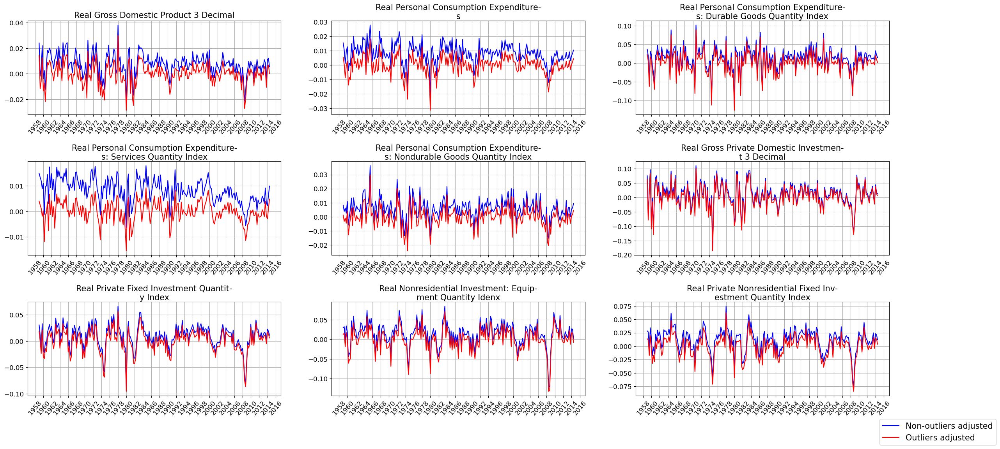

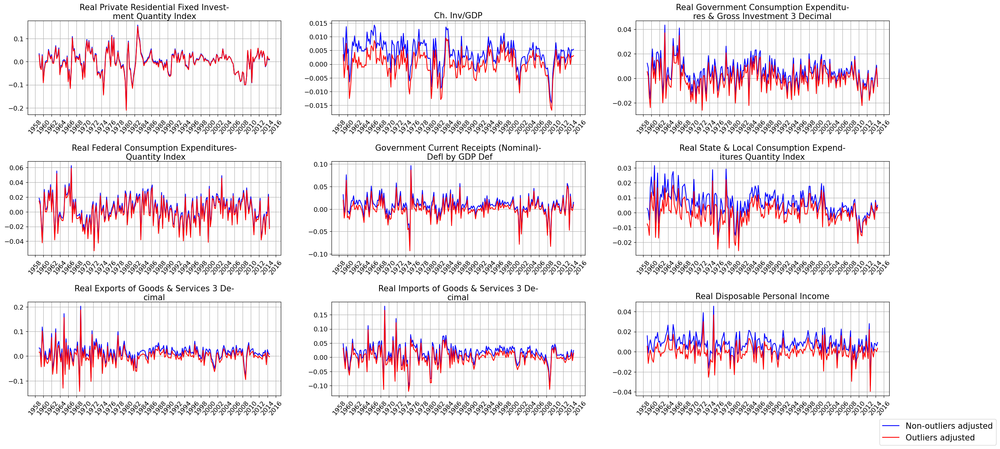

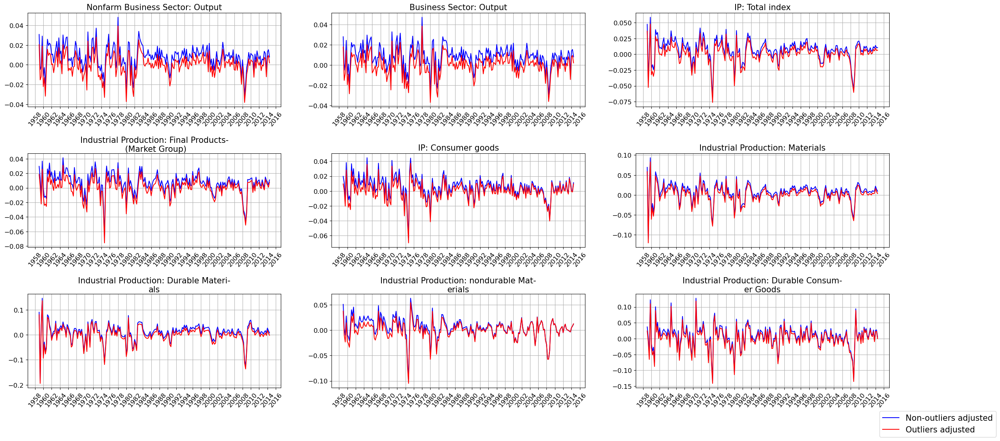

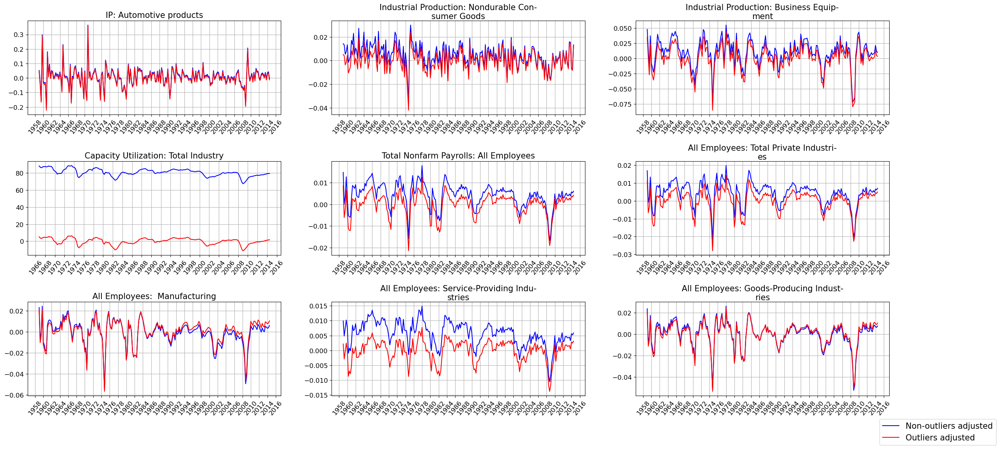

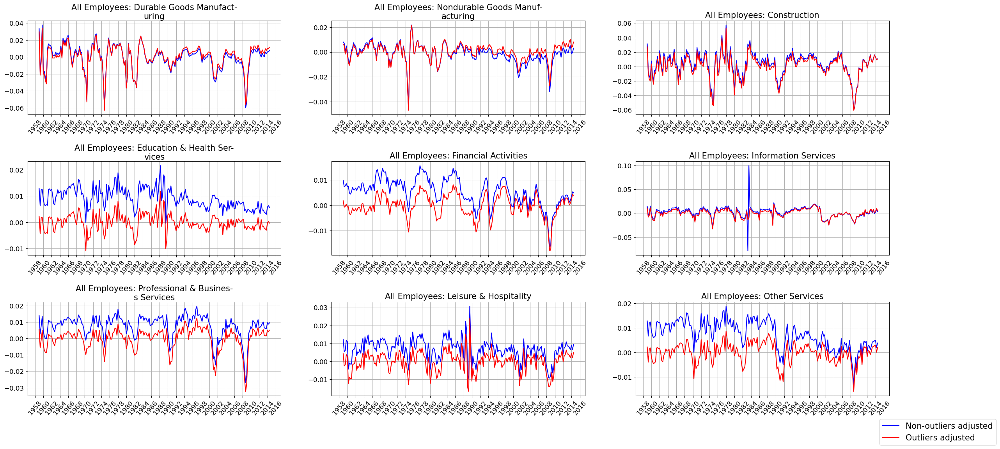

...

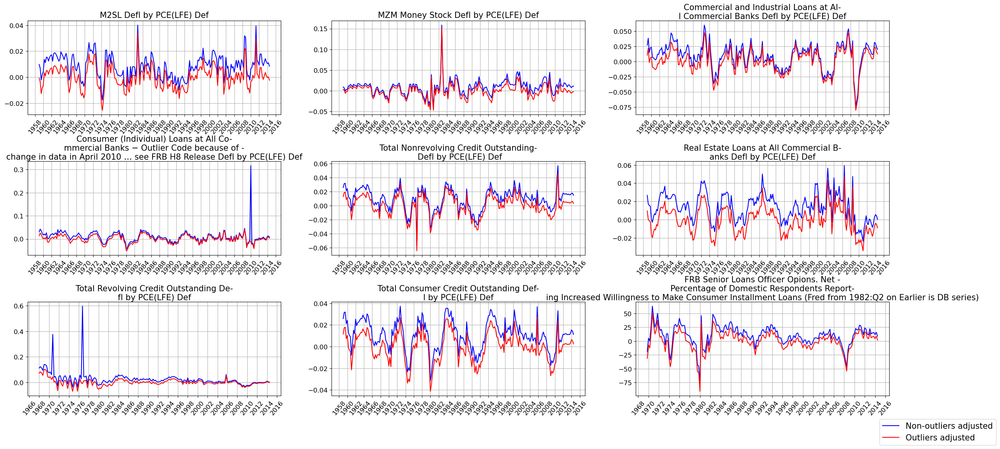

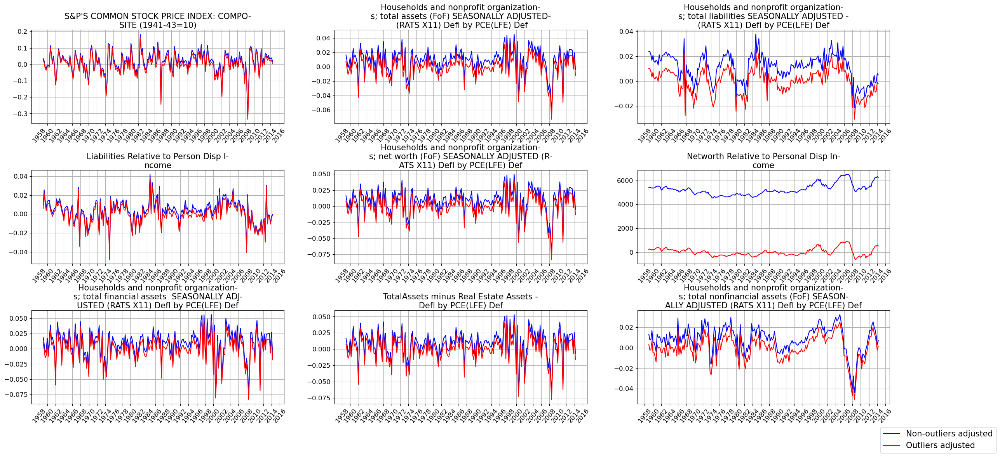

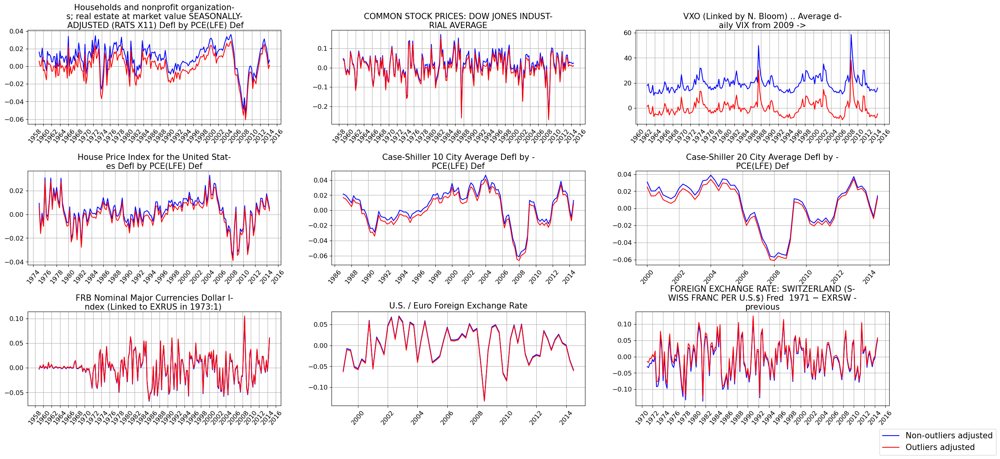

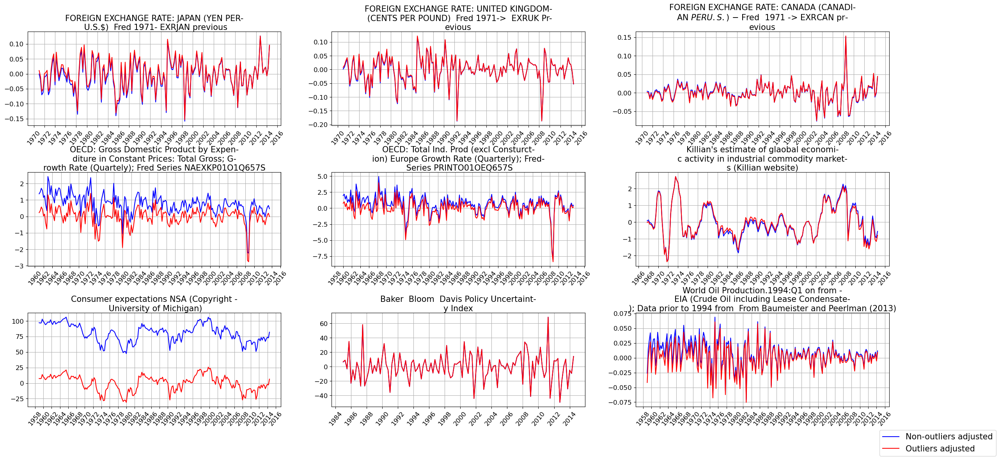

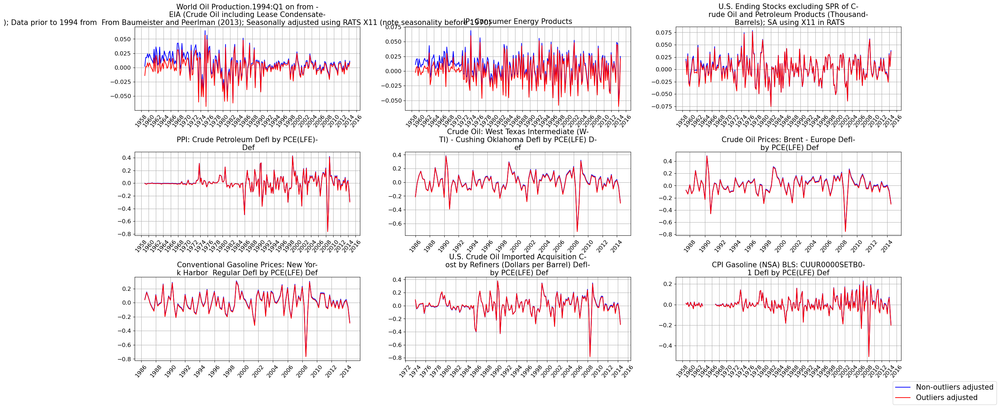

In [136]:
## Mock plot
plt.rcParams.update({'font.size': 12})
for j in range(207//9):
    fig,axes = plt.subplots(3,3)
    fig.set_size_inches(28.5, 12.5)
    axes = axes.flatten()
    for m,ax in enumerate(axes):
        i = j*9 + m
        ax.plot(bpdata_noa.Date,bpdata_noa.iloc[:,i],'b',label="Non-outliers adjusted")
        ax.set_title(bpdata_noa.columns[i],wrap=True)
        ax.plot(bpdata.Date,bpdata.iloc[:,i],'r',label="Outliers adjusted")
        ax.tick_params(axis='x', labelrotation = 50)
        ax.xaxis.set_major_locator(mdates.YearLocator(2))
        ax.title.set_fontsize(15)
        ax.grid(True)
    handles, labels = ax.get_legend_handles_labels()
    fig.subplots_adjust(hspace=0.5)
    fig.legend(handles, labels, prop = { "size": 15 },loc='lower right')
    fig.savefig("Variables "+ str(j*9)+" to "+str((j+1)*9+1) + ".png")